In [1]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
debussy_file = 'audio/debussy.wav'
redhot_file = 'audio/redhot.wav'
duke_file = 'audio/duke.wav'

In [4]:
debussy, _ = librosa.load(debussy_file)
redhot, _ = librosa.load(redhot_file)
duke, _  = librosa.load(duke_file)

In [7]:
FRAME_LENGTH = 1024
HOP_LENGTH = 512

rmse_debussy = librosa.feature.rms(debussy, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
rmse_redhot = librosa.feature.rms(redhot, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
rmse_duke = librosa.feature.rms(duke, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]

In [8]:
rmse_debussy.shape

(1292,)

(-1.0, 1.0)

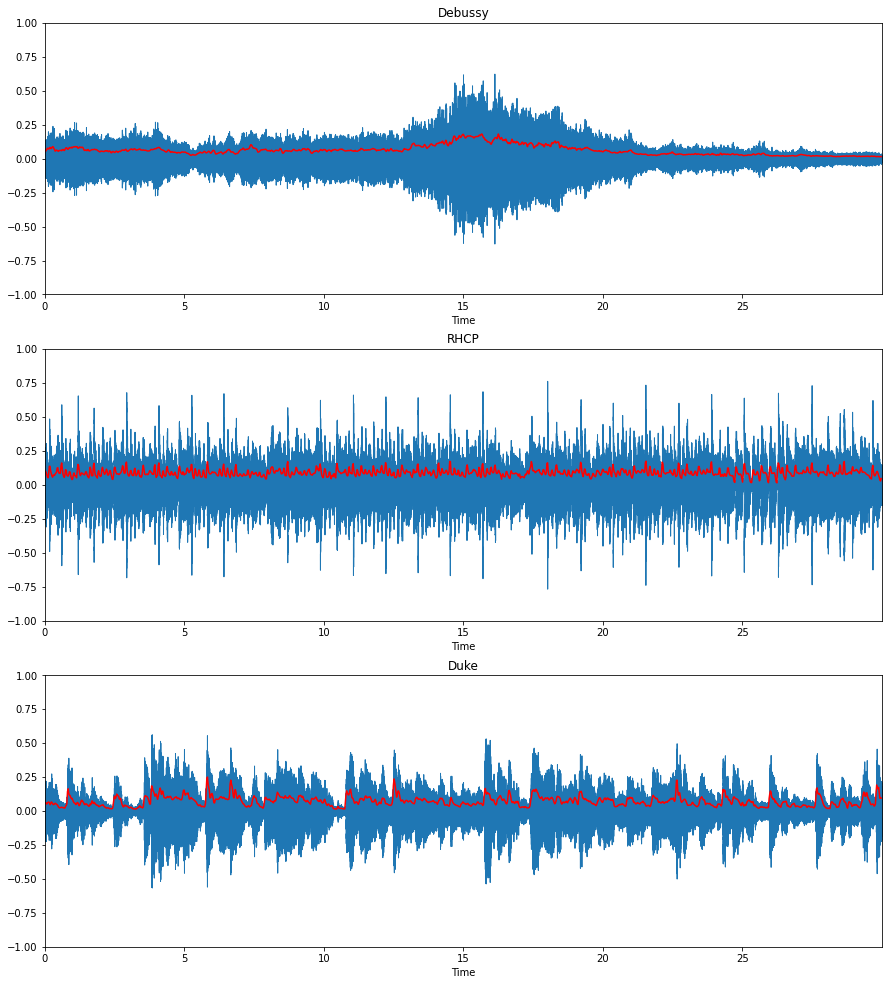

In [11]:
# visualise rmse for all the files

frames = range(0,rmse_debussy.size)
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)


plt.figure(figsize=(15,17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(debussy)
plt.plot(t, rmse_debussy, color='r')
plt.title('Debussy')
plt.ylim(-1, 1)

plt.subplot(3, 1, 2)
librosa.display.waveplot(redhot)
plt.plot(t, rmse_redhot, color='r')
plt.title('RHCP')
plt.ylim(-1, 1)

plt.subplot(3, 1, 3)
librosa.display.waveplot(duke)
plt.plot(t, rmse_duke, color='r')
plt.title('Duke')
plt.ylim(-1, 1)


In [12]:
def rms(signal, frame_length, hop_length):
    rms = []

    for i in range(0, len(signal), hop_length):
        current_rms = np.sqrt(np.sum(signal[i:i+frame_length] ** 2) / frame_length)
        rms.append(current_rms)
    
    return np.array(rms)

In [14]:
rms_debussy = rms(debussy, FRAME_LENGTH, HOP_LENGTH)
rms_redhot = rms(redhot, FRAME_LENGTH, HOP_LENGTH)
rms_duke = rms(duke, FRAME_LENGTH, HOP_LENGTH)


(-1.0, 1.0)

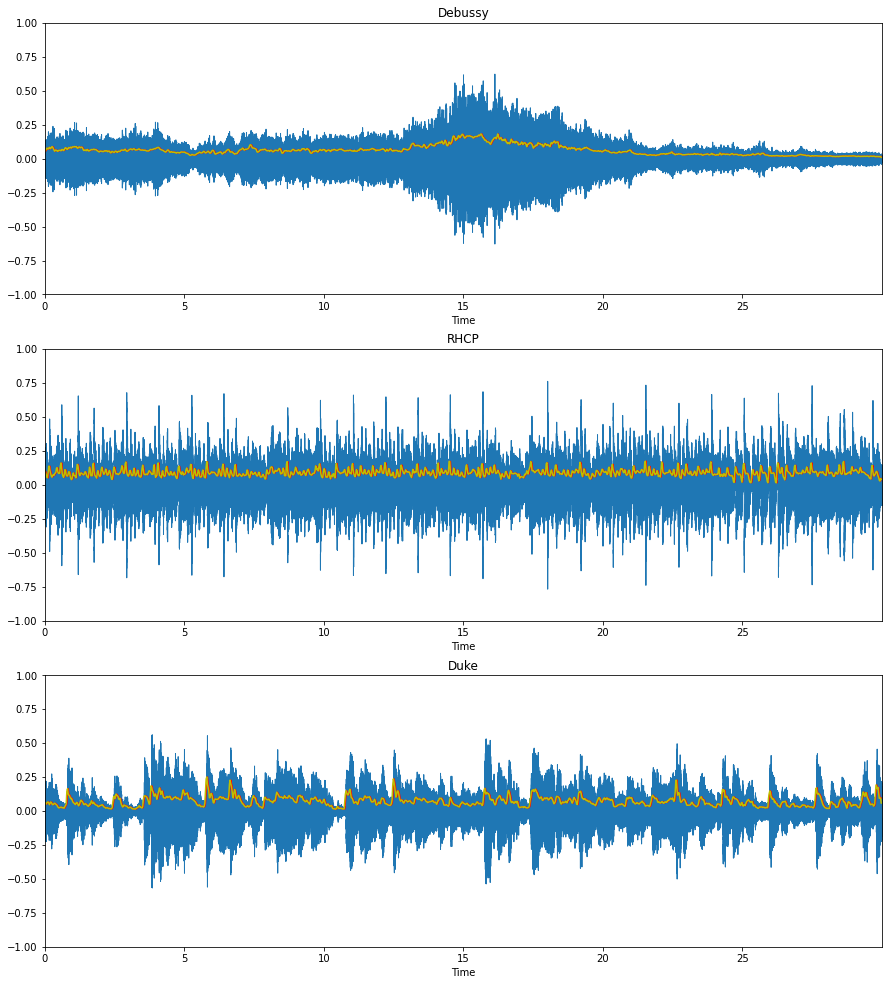

In [15]:
plt.figure(figsize=(15,17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(debussy)
plt.plot(t, rmse_debussy, color='r')
plt.plot(t, rms_debussy, color='y')
plt.title('Debussy')
plt.ylim(-1, 1)

plt.subplot(3, 1, 2)
librosa.display.waveplot(redhot)
plt.plot(t, rmse_redhot, color='r')
plt.plot(t, rms_redhot, color='y')
plt.title('RHCP')
plt.ylim(-1, 1)

plt.subplot(3, 1, 3)
librosa.display.waveplot(duke)
plt.plot(t, rmse_duke, color='r')
plt.plot(t, rms_duke, color='y')
plt.title('Duke')
plt.ylim(-1, 1)


In [16]:
# zero crossing rate


zcr_debussy = librosa.feature.zero_crossing_rate(debussy, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
zcr_redhot = librosa.feature.zero_crossing_rate(redhot, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
zcr_duke = librosa.feature.zero_crossing_rate(duke, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]

(0.0, 500.0)

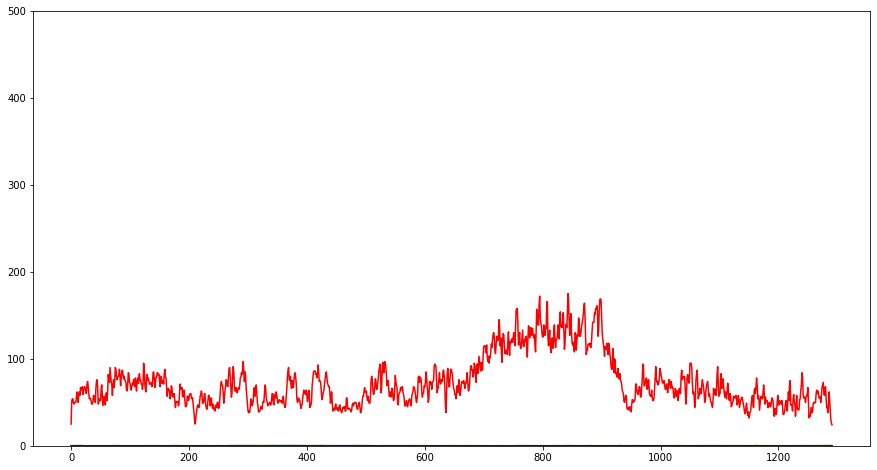

In [31]:
plt.figure(figsize=(15,8))
plt.plot(zcr_debussy * FRAME_LENGTH, color='r')
plt.plot(zcr_redhot, color='g')
plt.plot(zcr_duke, color='b')
plt.ylim(0, 500)


In [32]:
voice_file = 'audio/voice.wav'
noise_file = 'audio/noise.wav'

In [33]:
voice, _ =  librosa.load(voice_file, duration=15)
noise, _ = librosa.load(noise_file, duration=15)

In [35]:
zcr_voice = librosa.feature.zero_crossing_rate(voice, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
zcr_noise = librosa.feature.zero_crossing_rate(noise, frame_length=FRAME_LENGTH)[0]

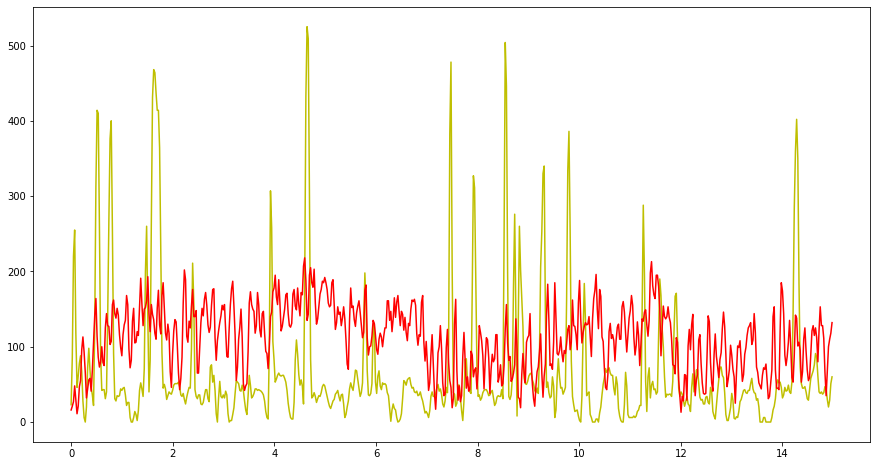

In [38]:
frames = range(0, len(zcr_voice))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)


plt.figure(figsize=(15,8))
plt.plot(t, zcr_voice * FRAME_LENGTH, color='y')
plt.plot(t, zcr_noise * FRAME_LENGTH, color='r')